### Ноут с реализацией построения графа и расчётом основных статистик

- calculating statistics
- applying basic CPD methods
- example of clustering

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import itertools


# для создания графа
import networkx as nx

# для сохранения полученных файлов
import pickle

%config InlineBackend.figure_format = 'retina'

# для записи и сохранения файлов
import os
import pickle
from tqdm import tqdm


# классы по созданию и анализу графов
from preproc_module import CryptoPreproc
from Graph_module import GraphBuilder,GraphAnalysis

/opt/anaconda3/lib/python3.11/site-packages/numba/core/decorators.py:250: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


#### Building graph

In [3]:
crypto_values = pd.read_csv("crypto_values_close.csv")
crypto_values['Date'] = pd.to_datetime(crypto_values.Date).dt.date


preprocessor = CryptoPreproc(crypto_values)
returns = preprocessor.returns_calc()
returns.head()
transfer_entropies = preprocessor.calculate_transfer_entropy(returns)

transfer_entropies.to_csv('transfer_entropies_new.csv')

In [4]:
transfer_entropies = pd.read_csv("transfer_entropies.csv")
transfer_entropies['Date'] = pd.to_datetime(transfer_entropies.Date).dt.date
transfer_entropies.head()

,Unnamed: 0,Source,Target,Date,TransferEntropy
0,0,BTC-USD,ETH-USD,2018-07-12,0.623606
1,1,BTC-USD,USDT-USD,2018-07-12,0.032718
2,2,BTC-USD,BNB-USD,2018-07-12,0.139244
3,3,BTC-USD,XRP-USD,2018-07-12,0.288055
4,4,BTC-USD,DOGE-USD,2018-07-12,-0.112111


In [ ]:
# transfer_entropies.to_csv('transfer_entropies.csv')

In [5]:
graph_builder = GraphBuilder()


**Посмотрим на полученные статистики графа**

Результат для графа на основе корреляций


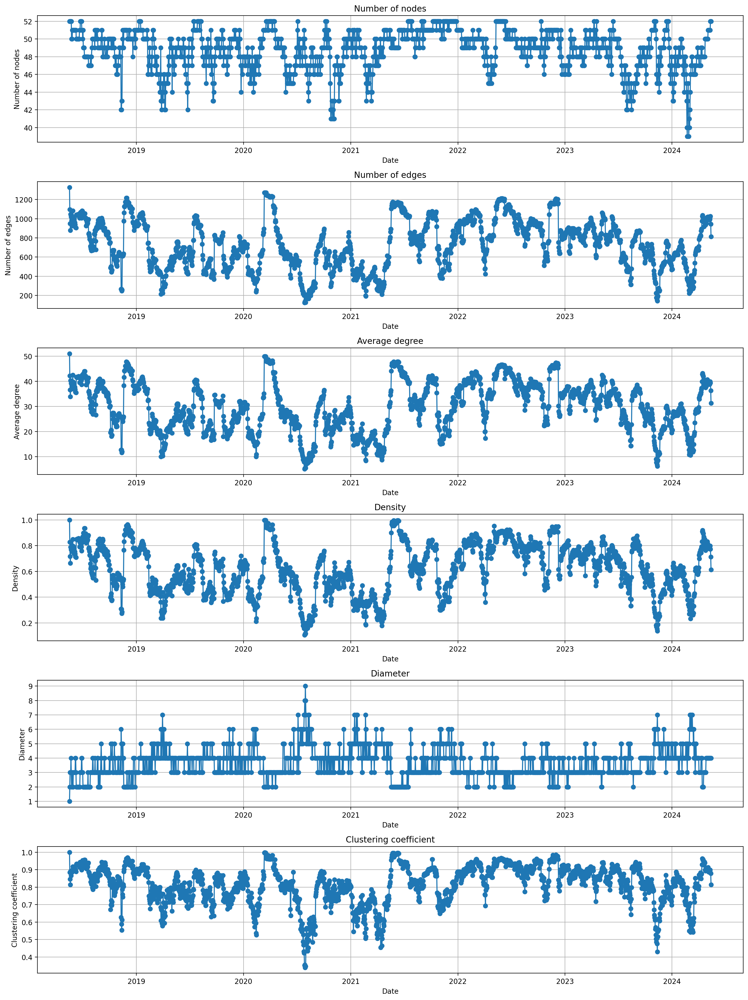

In [6]:
graph_builder = GraphBuilder()

print('Результат для графа на основе корреляций')
graph_builder.plot_graph_statistics('graphs')

Результат для графа на основе энтропии


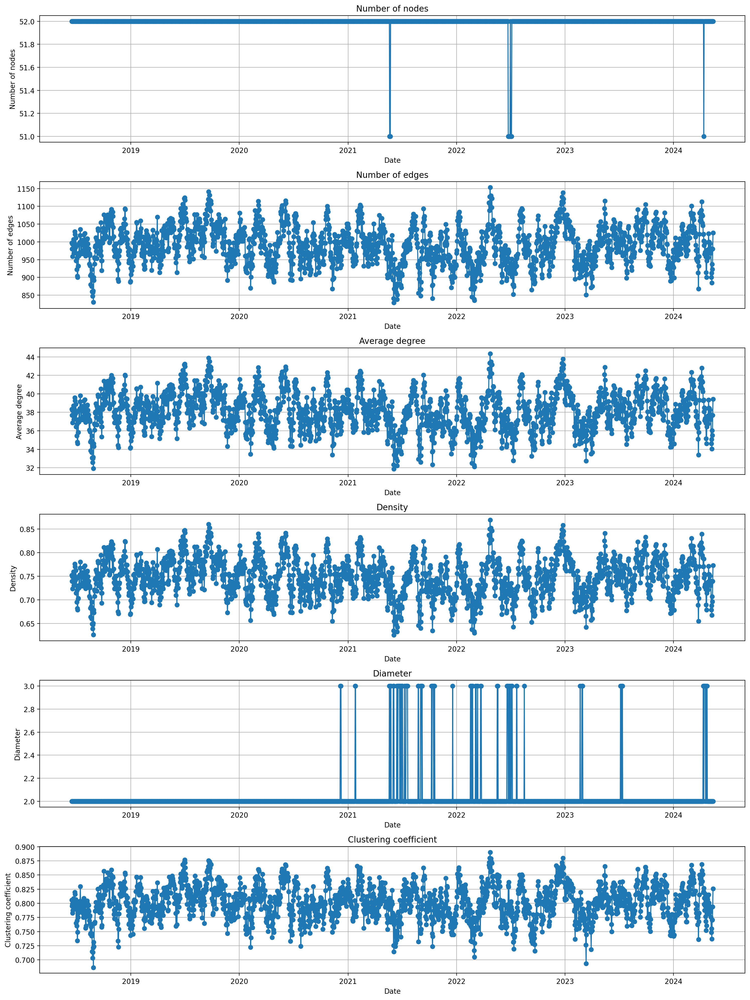

In [7]:
graph_builder = GraphBuilder()

print('Результат для графа на основе энтропии')
graph_builder.plot_graph_statistics('graphs_entropy')


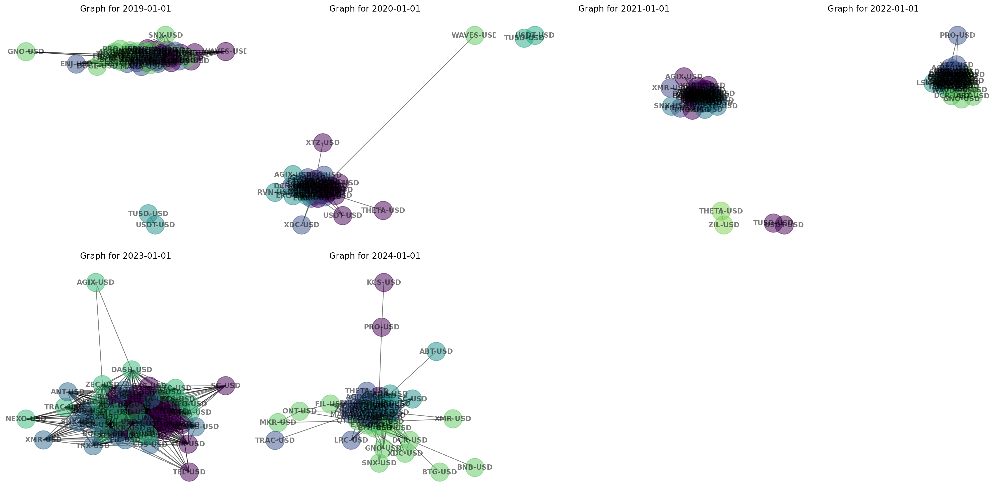

In [7]:
# Загрузка и визуализация графов из файлов
path = 'graphs'
corr_graphs_files = [file for file in os.listdir(path) if file.endswith('.pkl')]
corr_graphs = graph_builder.load_graphs_from_files(corr_graphs_files, path)
# Загрузка и визуализация графов из файлов
te_graphs_files = [file for file in os.listdir(path) if file.endswith('.pkl')]

# Фильтрация файлов по 1 числу каждого месяца
first_of_month_files = []
for file in te_graphs_files:
    date_str = file.split('_')[-1].replace('.pkl', '')
    date = pd.to_datetime(date_str)
    if date.day == 1 and date.month == 1:
        first_of_month_files.append(file)
        

te_graphs = graph_builder.load_graphs_from_files(first_of_month_files, path)

te_partitions = {date: graph_builder.apply_louvain_clustering(G) for date, G in te_graphs.items()}
graph_builder.plot_graphs_with_clusters(te_graphs, te_partitions, cols=4)

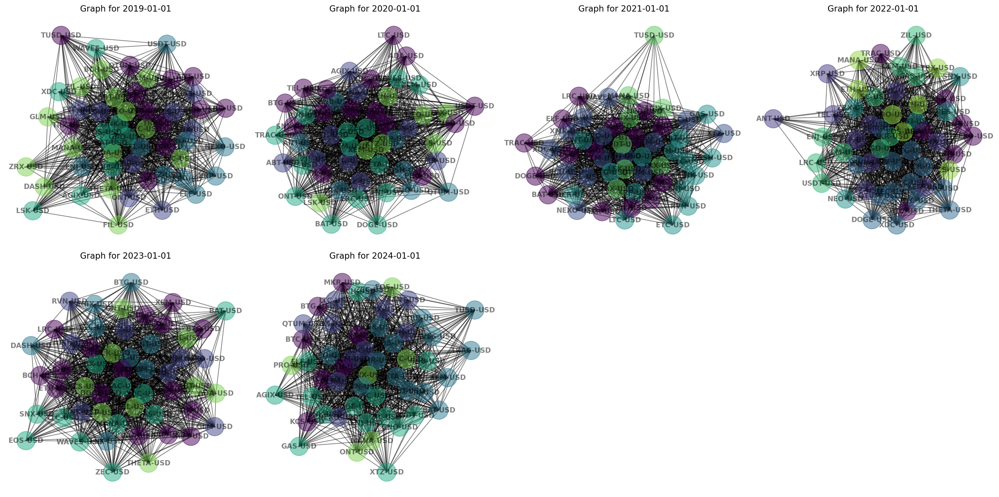

In [8]:
path = 'graphs_entropy'
te_graphs_files = [file for file in os.listdir(path) if file.endswith('.pkl')]
te_graphs = graph_builder.load_graphs_from_files(te_graphs_files, path)
# Загрузка и визуализация графов из файлов
te_graphs_files = [file for file in os.listdir(path) if file.endswith('.pkl')]

# Фильтрация файлов по 1 числу каждого месяца
first_of_month_files = []
for file in te_graphs_files:
    date_str = file.split('_')[-1].replace('.pkl', '')
    date = pd.to_datetime(date_str)
    if date.day == 1 and date.month == 1:
        first_of_month_files.append(file)
        

te_graphs = graph_builder.load_graphs_from_files(first_of_month_files, 'graphs_entropy')

te_partitions = {date: graph_builder.apply_louvain_clustering(G) for date, G in te_graphs.items()}
graph_builder.plot_graphs_with_clusters(te_graphs, te_partitions, cols=4)

#### Analize part

- applying basic CPD methods
- example of clustering

**The purpose of this work is to test the operation of CPD methods on graphs.**

**Before using more complex methods, let’s consider how the basic disorder detection method works on the Laplacian of a graph.**

*Briefly about Laplassian*:
- The Laplace matrix of a graph (`L`) is defined as the difference between the diagonal degree matrix (`D`) and the adjacency matrix (`A`):
`L = D - A`
- The diagonal degree matrix (`D`) contains the degrees of the graph nodes (the number of edges connecting each node).
- The adjacency matrix (`A`) contains information about the presence of connections between the nodes of the graph.

**Eigenvalues ​​of the Laplacian (**spectrum**) contain information about the structure of the graph.**
**A zero eigenvalue indicates the graph is connected.**

As statistics, we will consider the eigenvalues ​​of the Laplacian: the first and second largest for each moment in time

In [9]:
graph_analize = GraphAnalysis()

Результат для графа на основе корреляций


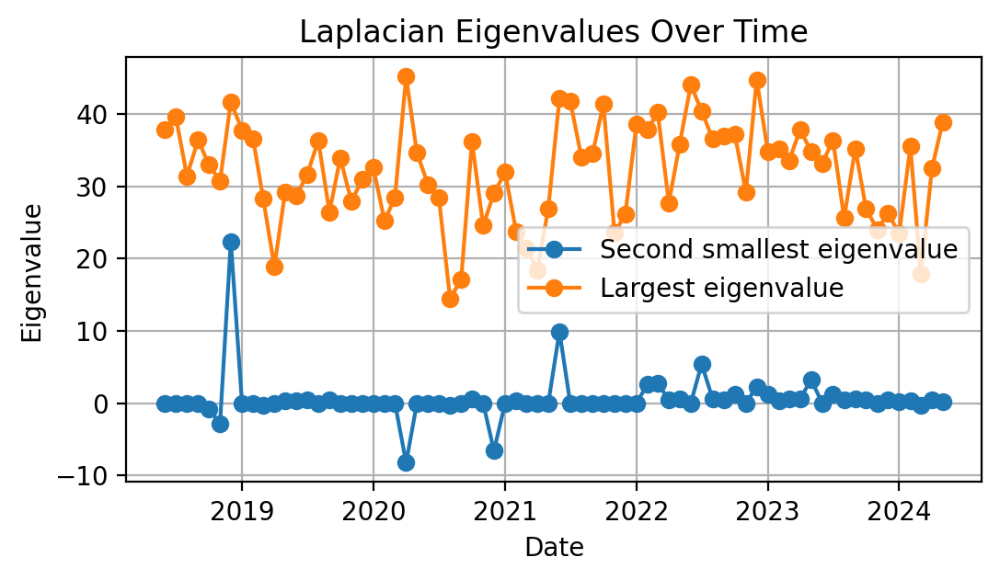

In [10]:
path = 'graphs'
pkl_files = [file for file in os.listdir(path) if file.endswith('.pkl')]
sorted_pkl_files = sorted(pkl_files)

files = []
for file in sorted_pkl_files:
    date_str = file.split('_')[-1].replace('.pkl', '')
    date = pd.to_datetime(date_str)
    # если смотрим только на 1 число каждого месяца
    if date.day == 1:
        files.append(file)

print('Результат для графа на основе корреляций')
graphs, laplacian_stats = graph_analize.load_graphs_and_laplacian_stats(files,path)
graph_analize.plot_laplacian_statistics(laplacian_stats)


Результат для графа на основе трансфертной энтропии


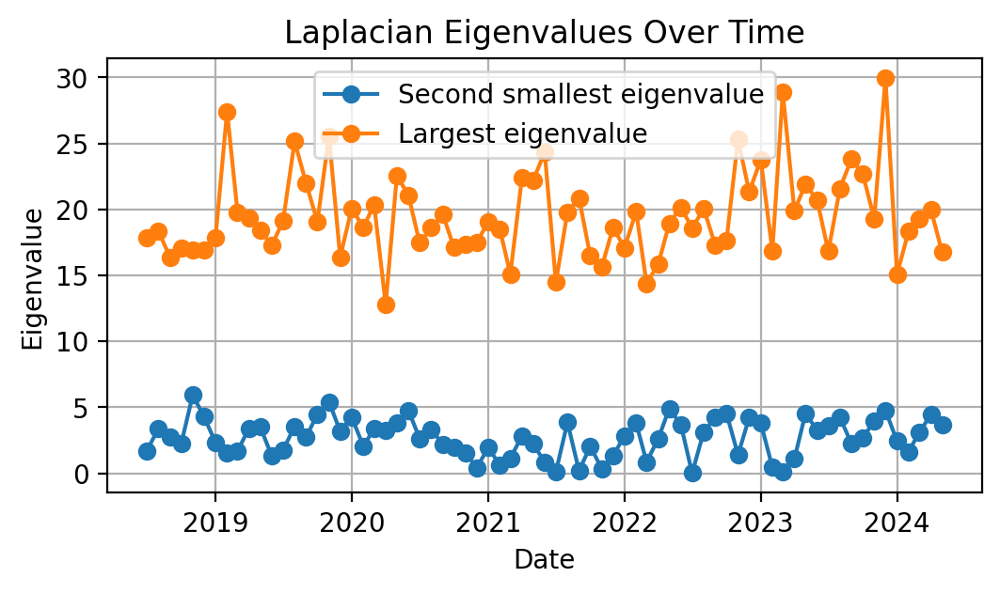

In [11]:
path = 'graphs_entropy'

pkl_files = [file for file in os.listdir(path) if file.endswith('.pkl')]
sorted_pkl_files = sorted(pkl_files)

files = []
for file in sorted_pkl_files:
    date_str = file.split('_')[-1].replace('.pkl', '')
    date = pd.to_datetime(date_str)
    # если смотрим только на 1 число каждого месяца
    if date.day == 1:
        files.append(file)

print('Результат для графа на основе трансфертной энтропии')
graphs, laplacian_stats = graph_analize.load_graphs_and_laplacian_stats(files,path)
graph_analize.plot_laplacian_statistics(laplacian_stats)

**If you compare the behavior of the Laplacian statistics with the behavior of the statistics of the original graph, you can see the similarity of the peaks (especially for the largest eigenvalue)**

/Users/admin/Desktop/ВШЭ мага/1 курс/КР/Итог/Code/Graph_module.py:314: ComplexWarning: Casting complex values to real discards the imaginary part
  second_smallest_eigenvalues = np.array(second_smallest_eigenvalues).astype(float)
/Users/admin/Desktop/ВШЭ мага/1 курс/КР/Итог/Code/Graph_module.py:315: ComplexWarning: Casting complex values to real discards the imaginary part
  largest_eigenvalues = np.array(largest_eigenvalues).astype(float)
/Users/admin/Desktop/ВШЭ мага/1 курс/КР/Итог/Code/Graph_module.py:316: ComplexWarning: Casting complex values to real discards the imaginary part
  spectral_gaps = np.array(spectral_gaps).astype(float)


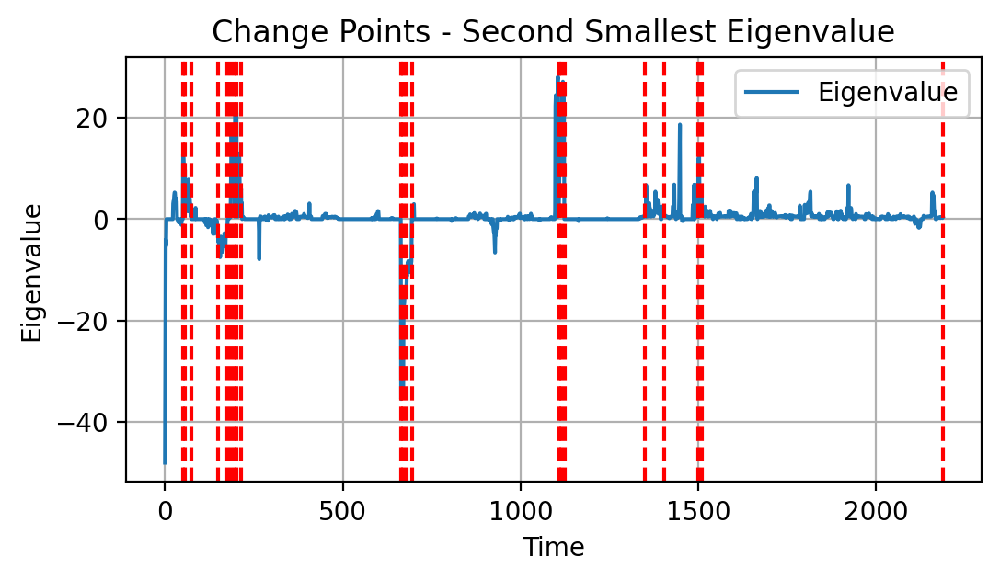

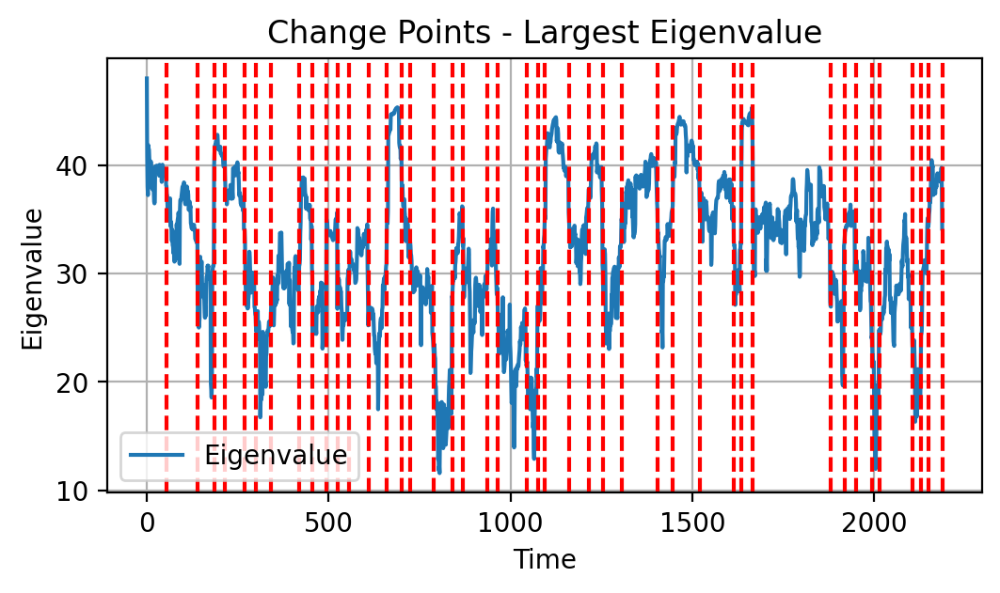

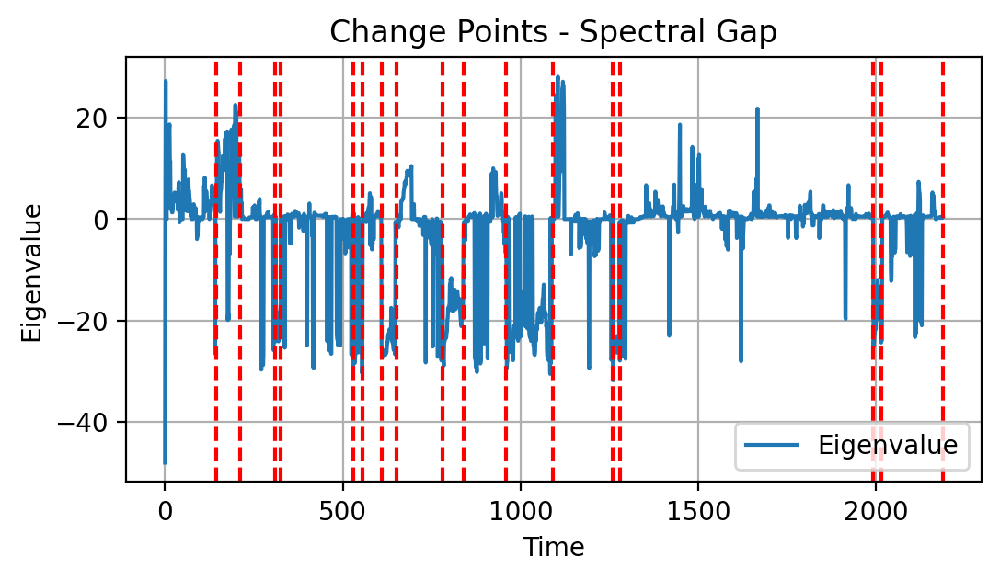

In [12]:
# Загрузка и визуализация графов из файлов
path = 'graphs'
te_graphs_files = [file for file in os.listdir(path) if file.endswith('.pkl')]

# # Фильтрация файлов по 1 числу каждого месяца
# first_of_month_files = []
# for file in te_graphs_files:
#     date_str = file.split('_')[-1].replace('.pkl', '')
#     date = pd.to_datetime(date_str)
#     if date.day == 1: #and date.month == 1:
#         first_of_month_files.append(file)
        

te_graphs = graph_builder.load_graphs_from_files(te_graphs_files, path)


# Лапласиан и изменение точек для графов
analysis = GraphAnalysis()
te_laplacian_stats = {date: analysis.calculate_laplacian_statistics(G) for date, G in te_graphs.items()}

analysis.apply_cpd(te_laplacian_stats)

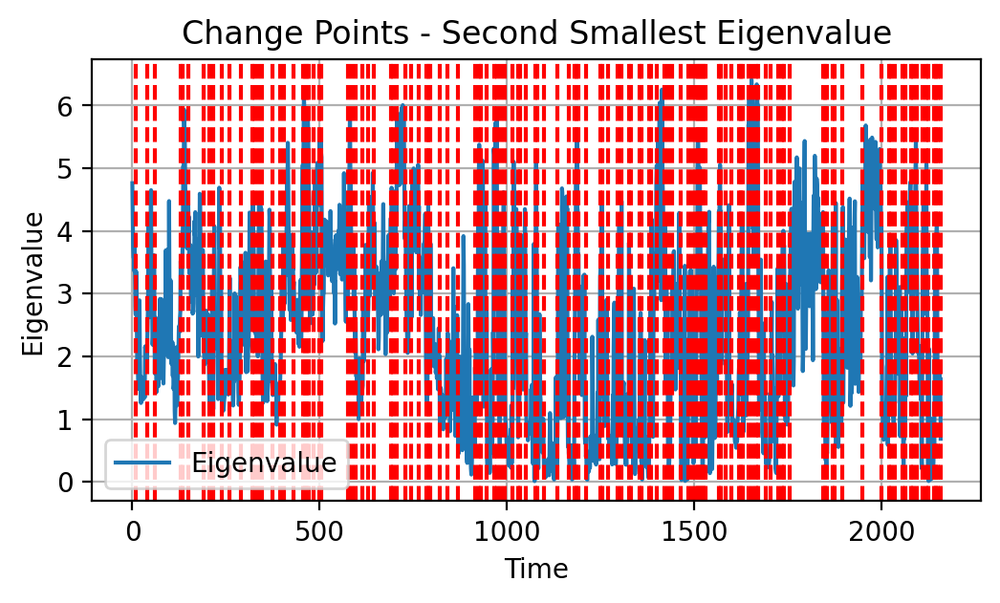

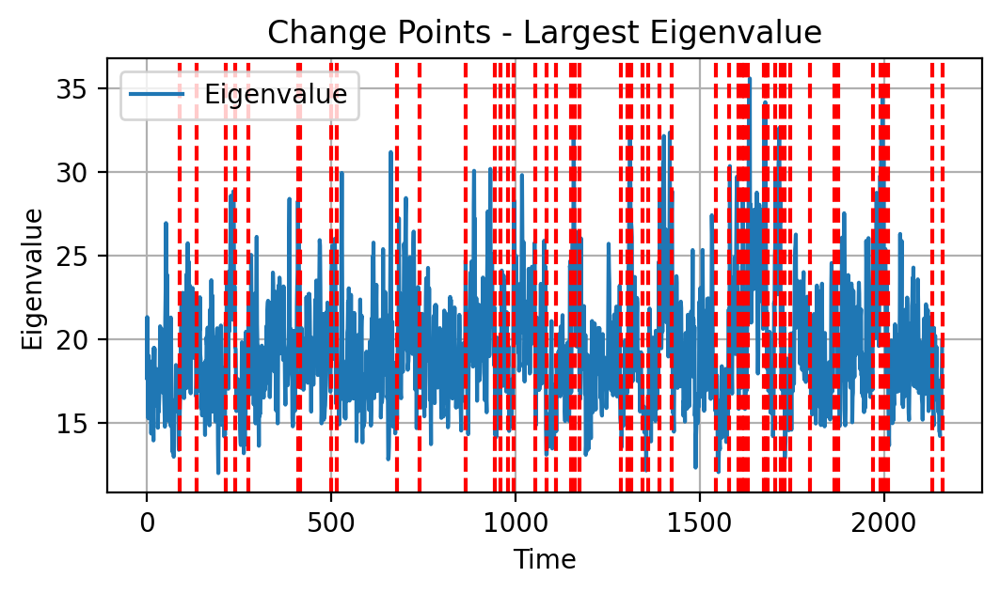

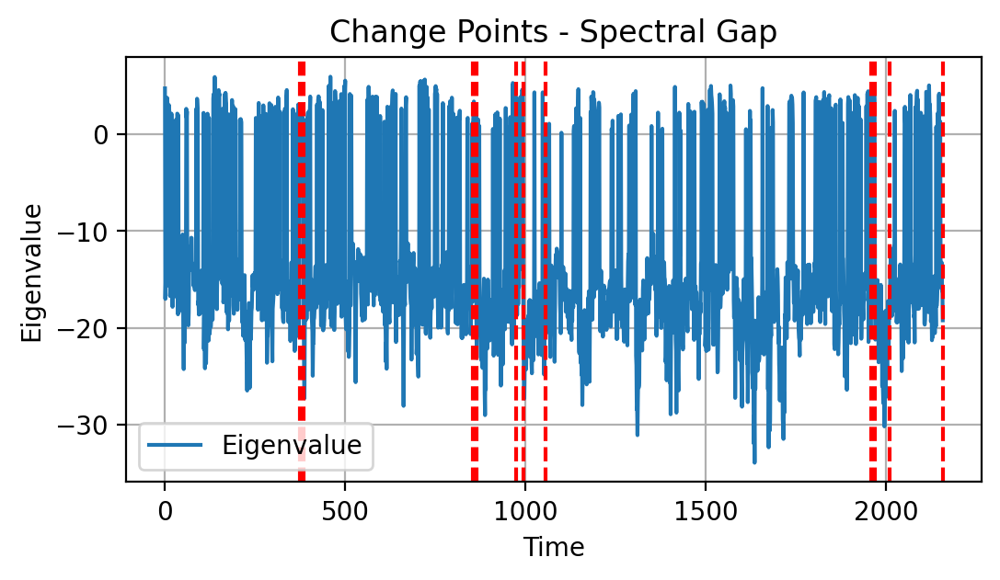

In [13]:
# Загрузка и визуализация графов из файлов
path = 'graphs_entropy'
te_graphs_files = [file for file in os.listdir(path) if file.endswith('.pkl')]

# # Фильтрация файлов по 1 числу каждого месяца
# first_of_month_files = []
# for file in te_graphs_files:
#     date_str = file.split('_')[-1].replace('.pkl', '')
#     date = pd.to_datetime(date_str)
#     if date.day == 1: #and date.month == 1:
#         first_of_month_files.append(file)
        

te_graphs = graph_builder.load_graphs_from_files(te_graphs_files, path)

analysis = GraphAnalysis()
te_laplacian_stats = {date: analysis.calculate_laplacian_statistics(G) for date, G in te_graphs.items()}

analysis.apply_cpd(te_laplacian_stats)

**As we can see from the graphs, cyclicity is observed in the graph statistics.** \
**Since the number of coins is the same, and the trash hold is constant, there is no trend to change the main parameters of the graph.** \
**However, we see that almost all the statistics considered repeat each other’s shift.**

**One more metric has been added here - *Spectral gap* in the context of the Laplacian of a graph is the difference between the first and second smallest eigenvalues ​​of the Laplacian matrix.**

As you can see, each of the statistics shows its own CPD value, while it is noticeable that Largest Eigenvalue has more unstable behavior compared to other metrics

But in general, the methods work well and capture fluctuations in the series.\
The penalty has a great influence on the result, which in this version is calculated based on the dispersion of the series